# Endometriosis - Clustering
# Nuclei

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '/nfs/team292/lg18/endometriosis/analysis_results/nuclei_only/main/'
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

palette = ["#E31A1C", "#1F78B4", "#A6CEE3",  "#B2DF8A", "#33A02C", "#FB9A99",  "#FDBF6F", "#FF7F00", "#CAB2D6", "#6A3D9A", "#FFFF99", "#B15928", "#66C2A5",
               "#FC8D62", "#8DA0CB", "#B3B3B3", "#A6D854", "#FFD92F", "#E5C494", "#E78AC3"]


sys.executable

'/home/jovyan/my-conda-envs/sc_analysis/bin/python'

## Load data

In [2]:
path2datas = '/nfs/team292/lg18/endometriosis/integrated_objects/'
adata = sc.read(path2datas+'nuclei_integrated.h5ad')
adata.X.shape

(372867, 33578)

In [3]:
meta_sample = pd.read_csv('metadata-libraries_deconvoluted.csv',index_col=1)
meta_sample


annot = meta_sample['Biopsy_type'].to_dict()
adata.obs['Biopsy_type'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Biopsy_type'].value_counts())

annot = meta_sample['Tissue_sampled'].to_dict()
adata.obs['Tissue_sampled'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Tissue_sampled'].value_counts())

annot = meta_sample['Group'].to_dict()
adata.obs['Group'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Group'].value_counts())

annot = meta_sample['Spatial_location'].to_dict()
adata.obs['Spatial_location'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Spatial_location'].value_counts())

annot = meta_sample['Ectopic_group'].to_dict()
adata.obs['Ectopic_group'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Ectopic_group'].value_counts())

annot = meta_sample['BiopsyType_old'].to_dict()
adata.obs['BiopsyType_old'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['BiopsyType_old'].value_counts())

annot = meta_sample['Tissue'].to_dict()
adata.obs['Tissue'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Tissue'].value_counts())

annot = meta_sample['Treatment'].to_dict()
adata.obs['Treatment'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Treatment'].value_counts())

annot = meta_sample['10x kit'].to_dict()
adata.obs['10x kit'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['10x kit'].value_counts())


annot = meta_sample['Processing'].to_dict()
adata.obs['Processing'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Processing'].value_counts())

Superficial_Eutopic    372867
Name: Biopsy_type, dtype: int64
eutopic_endometrium    372867
Name: Tissue_sampled, dtype: int64
Endo_Superficial    273660
Ctrl_Superficial     99207
Name: Group, dtype: int64
Series([], Name: Spatial_location, dtype: int64)
Series([], Name: Ectopic_group, dtype: int64)
Superficial    372867
Name: BiopsyType_old, dtype: int64
None    348158
FT       24709
Name: Tissue, dtype: int64
None       328144
Percoll     29895
Mixed       14828
Name: Treatment, dtype: int64
3' v3.0    275132
3' v3.1     97735
Name: 10x kit, dtype: int64
Frozen    372867
Name: Processing, dtype: int64


## Add donor metadata

In [11]:
meta_donors = pd.read_csv('metadata-donors.csv',index_col=None)
meta_donors = meta_donors.set_index('Donor')
meta_donors

# annot = meta_donors['Endometrial pathology_A-F-H-P'].to_dict()
# adata.obs['Endometrial_pathology'] = adata.obs.genotype.map(annot)
# set(adata.obs['Endometrial_pathology'])

# annot = meta_donors['Endometriosis_stage'].to_dict()
# adata.obs['Endometriosis_stage'] = adata.obs.genotype.map(annot)
# set(adata.obs['Endometriosis_stage'])

# annot = meta_donors['Ectopic_EcP_EcO_EcPA_EcP-D'].to_dict()
# adata.obs['Ectopic_EcP_EcO_EcPA_EcP-D'] = adata.obs.genotype.map(annot)
# set(adata.obs['Ectopic_EcP_EcO_EcPA_EcP-D'])

# annot = meta_donors['Peritoneal_Ovarian_DIE'].to_dict()
# adata.obs['Peritoneal_Ovarian_DIE'] = adata.obs.genotype.map(annot)
# set(adata.obs['Peritoneal_Ovarian_DIE'])

# annot = meta_donors['Hormonal treatment'].to_dict()
# adata.obs['Hormonal treatment'] = adata.obs.genotype.map(annot)
# set(adata.obs['Hormonal treatment'])

# annot = meta_donors['Age'].to_dict()
# adata.obs['Age'] = adata.obs.genotype.map(annot)
# set(adata.obs['Age'])

# annot = meta_donors['Location'].to_dict()
# adata.obs['Location'] = adata.obs.genotype.map(annot)
# set(adata.obs['Location'])

annot = meta_donors['Binary Stage'].to_dict()
adata.obs['Binary Stage'] = adata.obs.genotype.map(annot)
print(adata.obs['Binary Stage'].value_counts())

annot = meta_donors['Stage'].to_dict()
adata.obs['Stage'] = adata.obs.genotype.map(annot)
adata.obs['Stage'].value_counts()

Proliferative    151005
Secretory        150801
Hormones          54827
Menstrual         15110
Unknown            1124
Name: Binary Stage, dtype: int64


Proliferative              142704
Secretory                   61607
Secretory Mid               57467
Hormones                    54827
Secretory Early             31727
Menstrual                   15110
Proliferative Late           7062
Proliferative Menstrual      1239
Unknown                      1124
Name: Stage, dtype: int64

In [5]:
adata.obs.head()

,n_genes,sample,library,StudyName,SampleID,Lane,Processing,Type,BiopsyType,BiopsyType_II,...,pct_counts_MT,S_score,G2M_score,phase,dataset,Biopsy_type,Tissue_sampled,Spatial_location,Ectopic_group,BiopsyType_old
UA_Endo12449300_CTTCAATGTACCGGAA,3302,UA_Endo12449300_EX0045,UA_Endo12449300,Marecckovaa,UA_Endo12449300,43996.0,Frozen,Nuclei,Superficial,NaN,...,0.339716,-0.078014,0.005412,G2M,Mareckova_Nuclei,Superficial_Eutopic,eutopic_endometrium,NaN,NaN,Superficial
UA_Endo11596521_GAACACTCAGAGAAAG,2282,UA_Endo11596521_FX1236,UA_Endo11596521,Marecckovaa,UA_Endo11596521,43281.0,Frozen,Nuclei,Superficial,NaN,...,1.429434,-0.045719,-0.017081,G1,Mareckova_Nuclei,Superficial_Eutopic,eutopic_endometrium,NaN,NaN,Superficial
UA_Endo12865963_TGCGGGTAGGGAGGGT,2786,UA_Endo12865963_FX1087,UA_Endo12865963,Marecckovaa,UA_Endo12865963,44999.0,Frozen,Nuclei,Superficial,NaN,...,0.994722,-0.114742,-0.134462,G1,Mareckova_Nuclei,Superficial_Eutopic,eutopic_endometrium,NaN,NaN,Superficial
UA_Endo12449301_TCAGTGATCGTAGGGA,2071,UA_Endo12449301_FX1150,UA_Endo12449301,Marecckovaa,UA_Endo12449301,43996.0,Frozen,Nuclei,Superficial,NaN,...,0.456919,-0.013804,-0.074582,G1,Mareckova_Nuclei,Superficial_Eutopic,eutopic_endometrium,NaN,NaN,Superficial
UA_Endo12865960_GAGACTTAGAGATCGC,1890,UA_Endo12865960_FX1170,UA_Endo12865960,Marecckovaa,UA_Endo12865960,44999.0,Frozen,Nuclei,Superficial,NaN,...,0.431894,-0.130319,0.046791,G2M,Mareckova_Nuclei,Superficial_Eutopic,eutopic_endometrium,NaN,NaN,Superficial


/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Processing' as categorical
... storing 'Tissue' as categorical
... storing 'Treatment' as categorical
... storing '10x kit' as categorical
... storing 'Group' as categorical
... storing 'Biopsy_type' as categorical
... storing 'Tissue_sampled' as categorical
... storing 'BiopsyType_old' as categorical


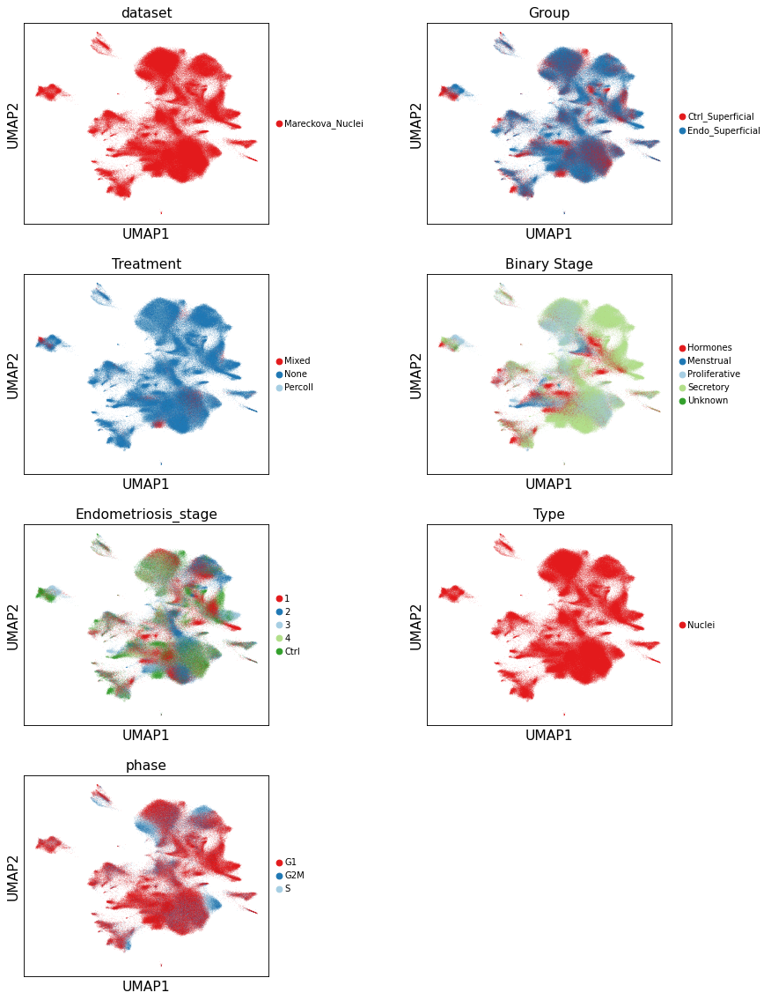

In [6]:
sc.pl.umap(sc.pp.subsample(adata, fraction=1, copy=True),
           color=['dataset', 'Group', 'Treatment', 'Binary Stage', 'Endometriosis_stage', 'Type', 'phase'], 
           wspace=0.5, legend_fontsize=9, ncols=2, save='_metadata.pdf', palette=palette)

In [7]:
annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/nuclei_endometrium.csv',index_col=0)
annot_df.index = [ a.replace('-Mareckova_Nuclei', '') for a, b in zip(annot_df.index, annot_df.Type.tolist())]
annot_df.head()

annot = annot_df['NucCell_celltype'].to_dict()
adata.obs['NucCell_celltype'] = adata.obs_names.map(annot)
print(adata.obs['NucCell_celltype'].value_counts())

Epi_Prolif         106990
Mesen_eS            91585
Epi_Glands          43239
Mesen_dS            40918
Epi_Lumen           22221
Immune_Lymphoid     19648
Immune_Myeloid      15904
Epi_MUC5B            9474
Doublet              8853
Endothelial          5749
Epi_Ciliated         3353
PV                   1618
Epi_P4               1562
SMCs                   50
Name: NucCell_celltype, dtype: int64


In [12]:
annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/labelTransfer_cell2nuc/epithelial/transferred_labels.csv',index_col=0)
annot_df.head()
annot_epi = annot_df['classifier'].to_dict()


annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/labelTransfer_cell2nuc/mesenchymal/transferred_labels.csv',index_col=0)
annot_df.head()
annot_mesen = annot_df['classifier'].to_dict()

annot = dict(annot_epi)
annot.update(annot_mesen)


adata.obs['LT_celltype'] = adata.obs_names.map(annot)
print(adata.obs['LT_celltype'].value_counts())

adata.obs['LT_epi_celltype'] = adata.obs_names.map(annot_epi)
print(adata.obs['LT_epi_celltype'].value_counts())

adata.obs['LT_mesen_celltype'] = adata.obs_names.map(annot_mesen)
print(adata.obs['LT_mesen_celltype'].value_counts())

eStromal                    44207
SOX9                        44144
Hormones                    27329
dStromal_mid                23002
preGlandular                22295
Glandular_secretory         18701
SOX9_luminal                17168
eStromal_MMPs               15466
ePV_MMP11                   15406
Glandular                   13212
dStromal_early              11649
MUC5B                        9007
dStromal_late                8478
preLuminal                   6377
SOX9_basalis_II              5304
Luminal                      4489
Ciliated                     3136
ePV_AOC3                     3093
uSMCs                        2343
Fibroblast_basalis           2342
HOXA13                       1518
SOX9_basalis_I                899
KRT5                          800
mPV                           681
ePV_STEAP4                    462
preCiliated                   334
Glandular_secretory_FGF7      231
dStromal_menstrual             25
Name: LT_celltype, dtype: int64
SOX9            

... storing 'Processing' as categorical
... storing 'Tissue' as categorical
... storing 'Treatment' as categorical
... storing '10x kit' as categorical
... storing 'Group' as categorical
... storing 'Binary Stage' as categorical
... storing 'Stage' as categorical
... storing 'Biopsy_type' as categorical
... storing 'Tissue_sampled' as categorical
... storing 'BiopsyType_old' as categorical
... storing 'NucCell_celltype' as categorical
... storing 'LT_celltype' as categorical
... storing 'LT_epi_celltype' as categorical
... storing 'LT_mesen_celltype' as categorical


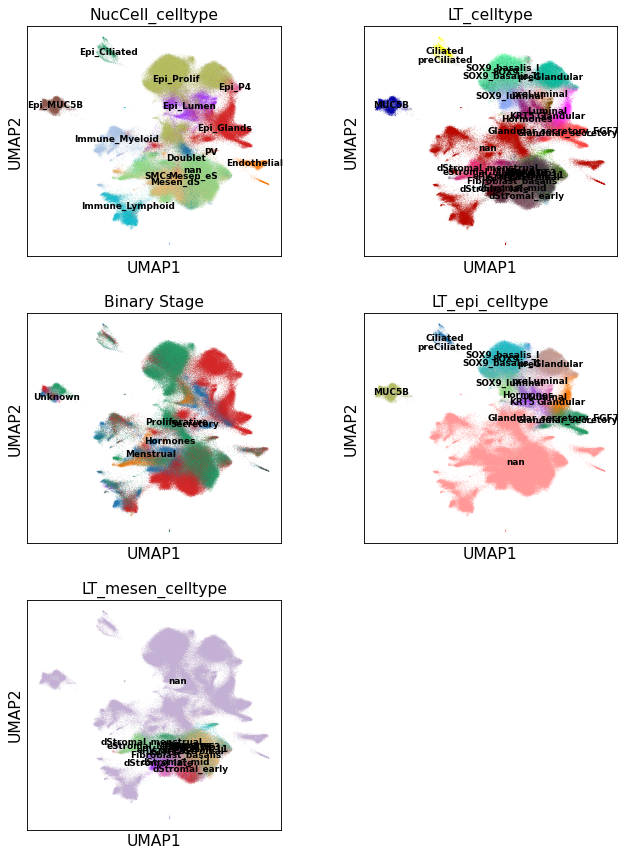

In [13]:
sc.pl.umap(adata, color=['NucCell_celltype', 'LT_celltype', 'Binary Stage', 'LT_epi_celltype', 'LT_mesen_celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)

SOX9_luminal


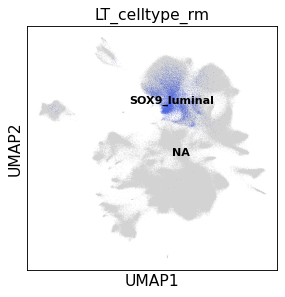

SOX9_basalis_I


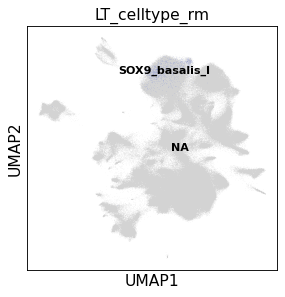

Glandular


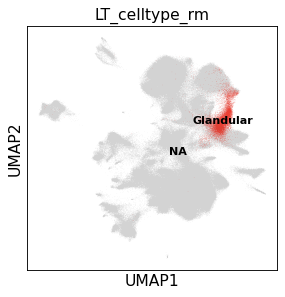

Fibroblast_basalis


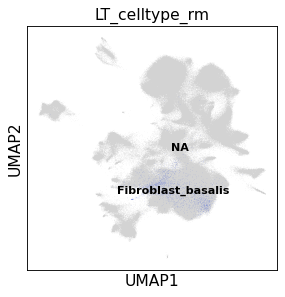

nan


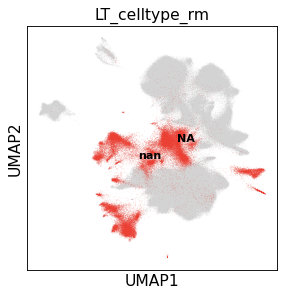

Luminal


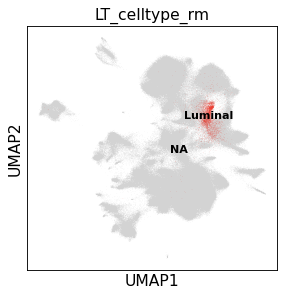

Hormones


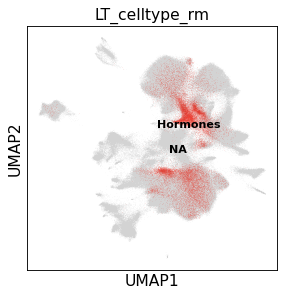

ePV_AOC3


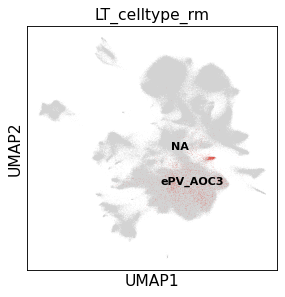

dStromal_menstrual


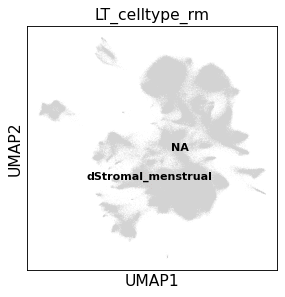

dStromal_early


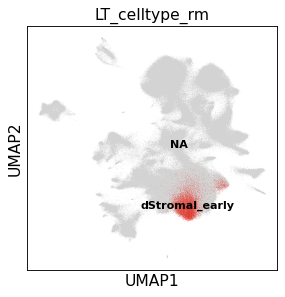

MUC5B


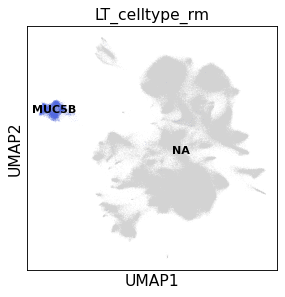

dStromal_late


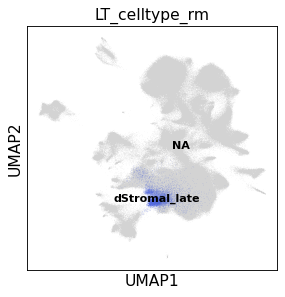

preLuminal


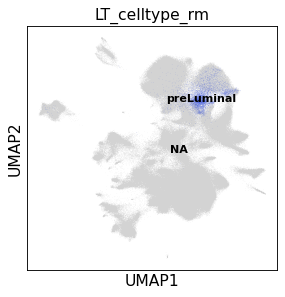

eStromal


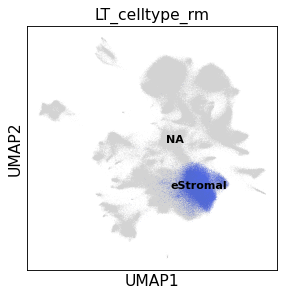

SOX9_basalis_II


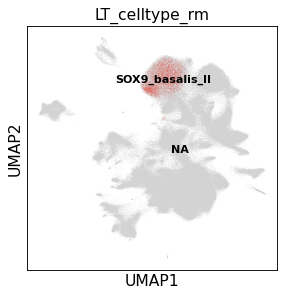

mPV


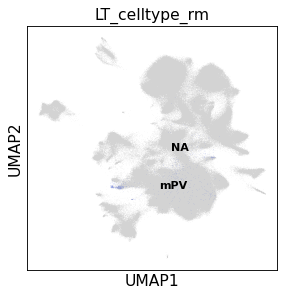

dStromal_mid


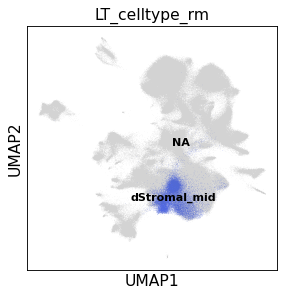

Ciliated


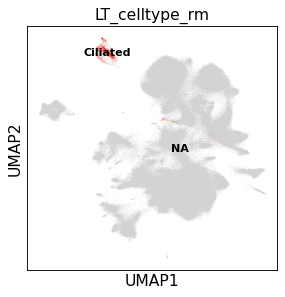

ePV_MMP11


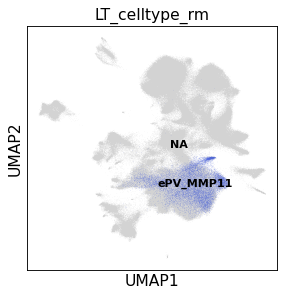

KRT5


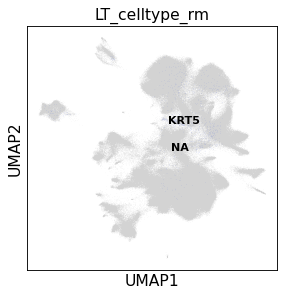

Glandular_secretory_FGF7


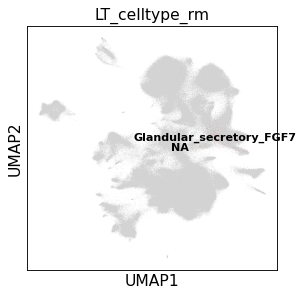

preGlandular


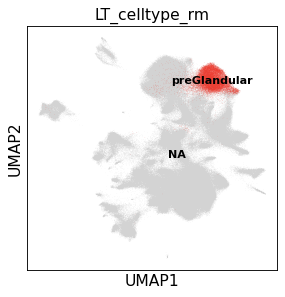

uSMCs


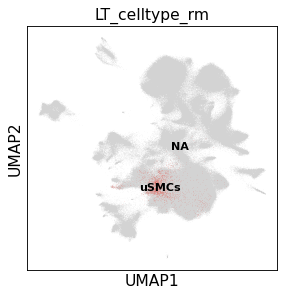

ePV_STEAP4


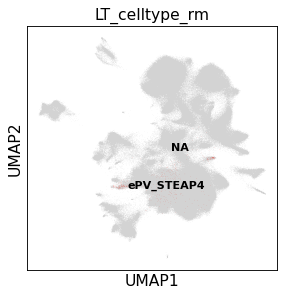

Glandular_secretory


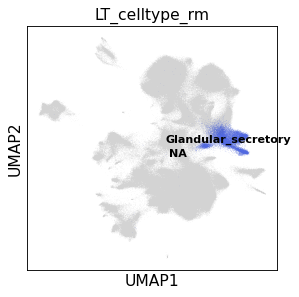

eStromal_MMPs


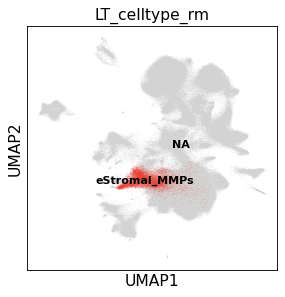

SOX9


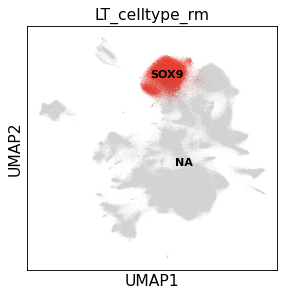

HOXA13


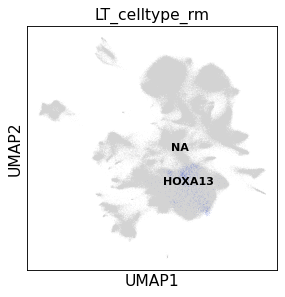

preCiliated


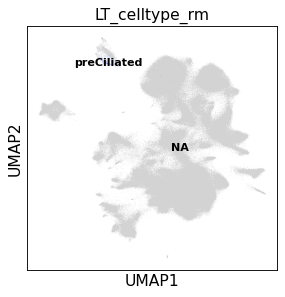

In [14]:
adata.obs['LT_celltype_rm'] = adata.obs.LT_celltype
for lin in set(adata.obs.LT_celltype):
    lin = str(lin)
    print(lin)
    sc.pl.umap(adata,
        groups=[lin],
        color=['LT_celltype_rm'],
        palette=['#eb4034', '#5169e0'],
        frameon=True, legend_loc='on data', legend_fontsize=10,
    )

## Clustering the graph
As Seurat and many others, we use the leiden graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by Levine et al. (2015).

In [15]:
sc.tl.leiden(adata, resolution=0.75)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:09:13)


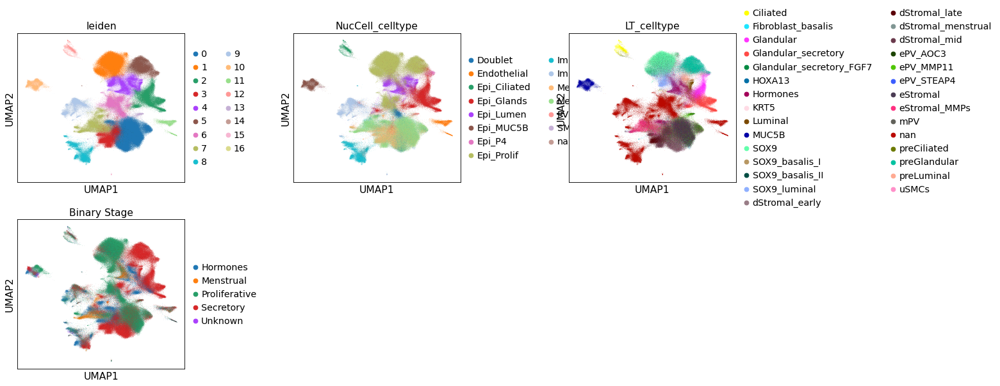

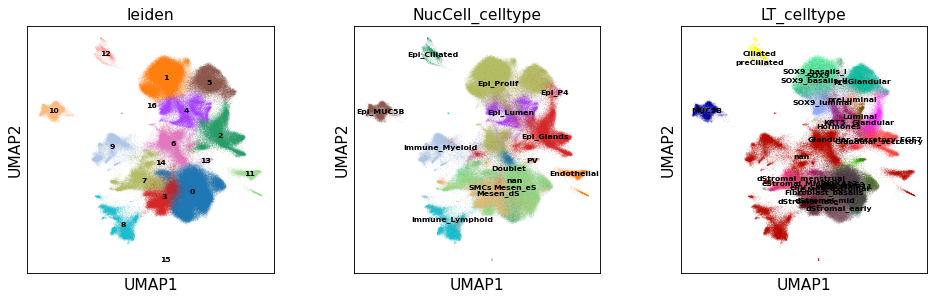

In [16]:
sc.pl.umap(adata, color=['leiden', 'NucCell_celltype', 'LT_celltype', 'Binary Stage'], wspace=0.5, ncols=3)
sc.pl.umap(adata, color=['leiden', 'NucCell_celltype', 'LT_celltype'],legend_loc='on data', legend_fontsize=7)

running Leiden clustering
    finished: found 20 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:04)


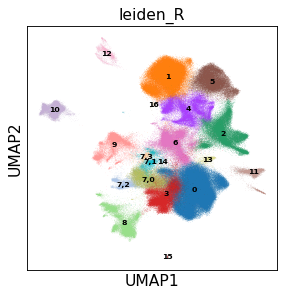

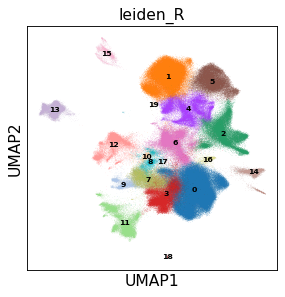

In [17]:
# split lowQC cluster
sc.tl.leiden(adata, resolution=0.3, restrict_to=('leiden', ['7']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 21 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


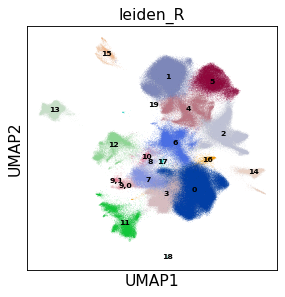

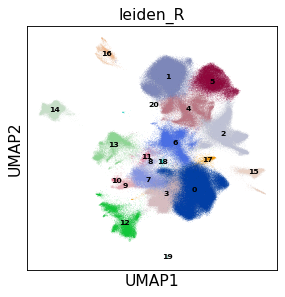

In [18]:
# split lowQC cluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['9']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

### Visualize general markers

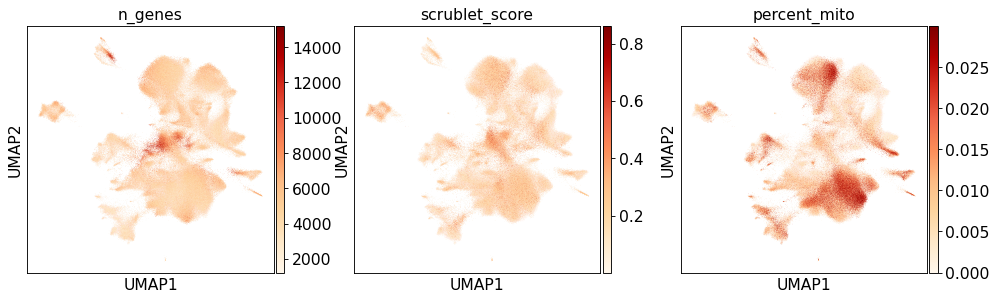

In [19]:
sc.pl.umap(adata, color=['n_genes','scrublet_score', 'percent_mito'], color_map='OrRd')

In [20]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:21): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


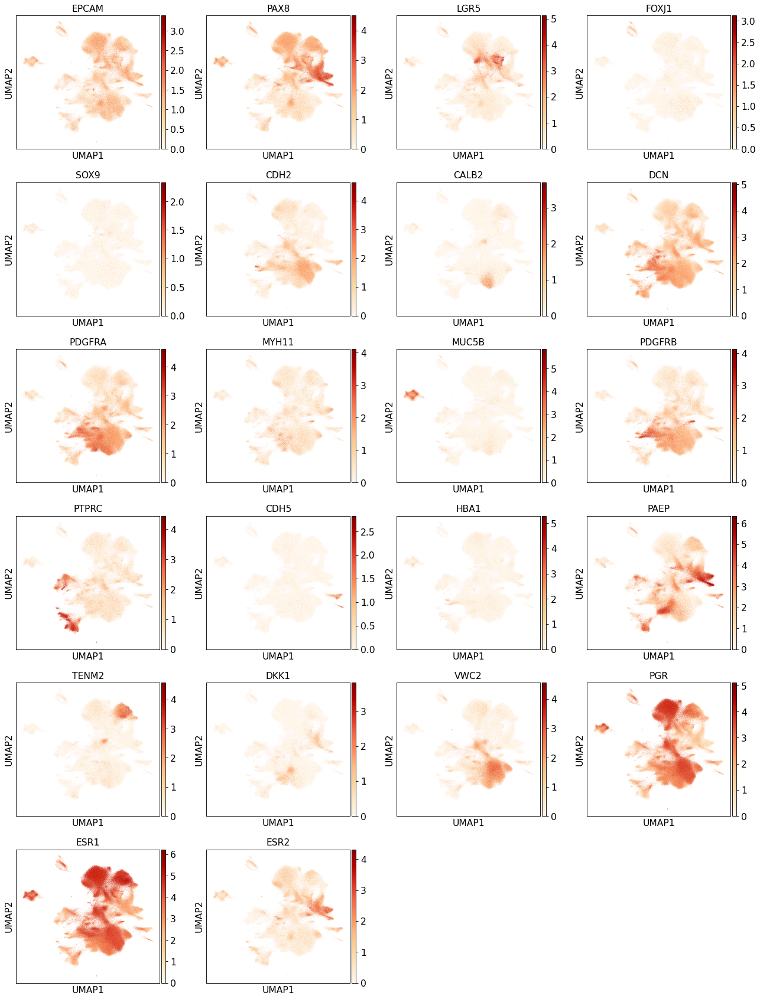

In [21]:
sc.pl.umap(adata, color=["EPCAM", "PAX8", 'LGR5', 'FOXJ1', 'SOX9', 'CDH2', 'CALB2',
                         "DCN", "PDGFRA",  "MYH11", 'MUC5B',
                         "PDGFRB", 'PTPRC', 'CDH5', 'HBA1', 'PAEP', 'TENM2', 'DKK1',  'VWC2', 'PGR', 'ESR1', 'ESR2'], color_map='OrRd', use_raw=False )

### Check global trends

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


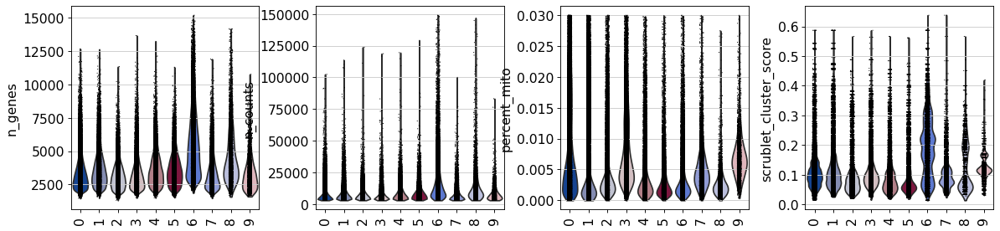

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


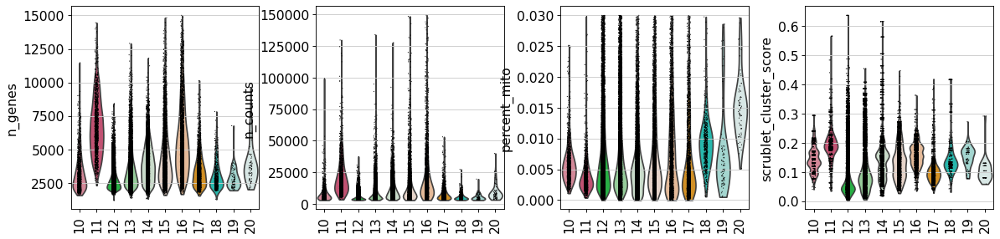

In [22]:
sc.pl.violin(adata[[ float(i) < 10 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)
sc.pl.violin(adata[[ float(i) >= 10 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)
# sc.pl.violin(adata, keys= ['percent_mito', 'scrublet_score', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)

# Finding marker genes

Compute a ranking for the highly differential genes in each cluster. Here, we simply rank genes with a t test, which agrees quite well with Seurat.

## All vs rest

In [23]:
# # Compute Mann-Withney test with scanpy
# sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False) #, method='logreg'
# # Plot
# sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, dendrogram=False, save='_scanpy.pdf', standard_scale = 'var')

In [24]:
def Barplot(which_var, adata, var='lineage', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

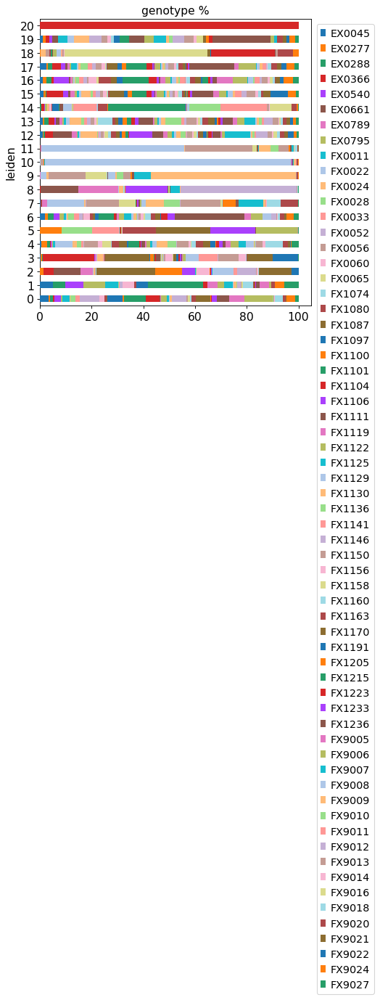

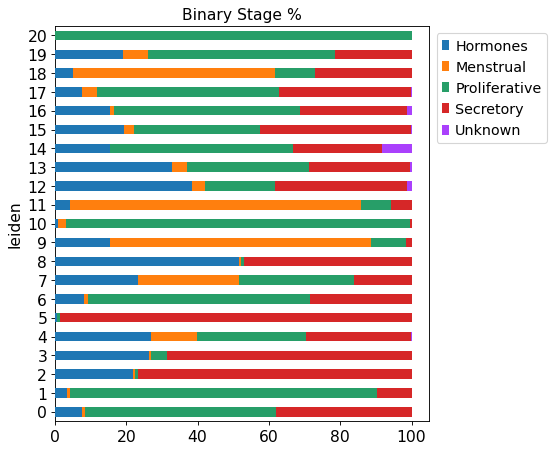

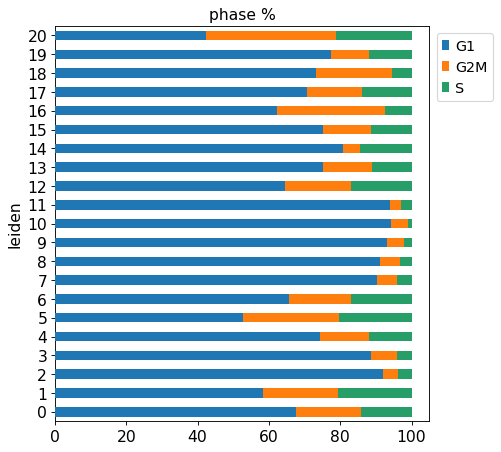

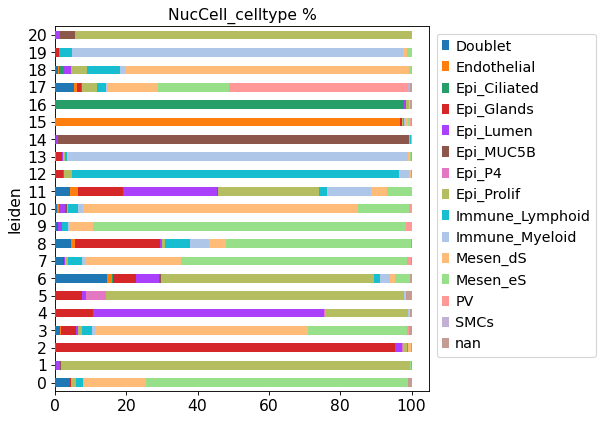

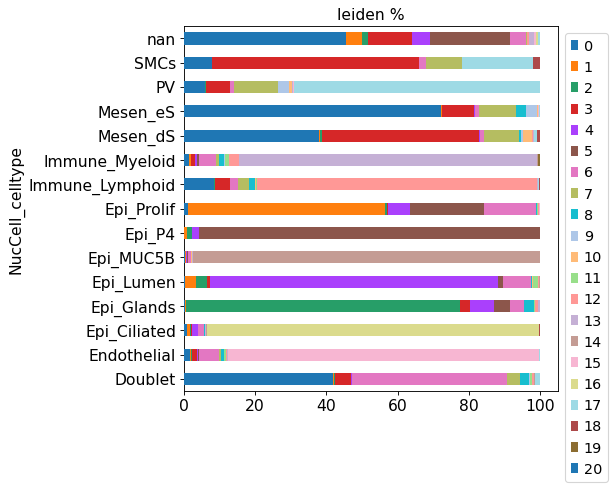

In [25]:
Barplot('genotype', adata, var='leiden', height=6.5)
Barplot('Binary Stage', adata, var='leiden', height=6.5)
Barplot('phase', adata, var='leiden', height=6.5)
Barplot('NucCell_celltype', adata, var='leiden', height=6)
Barplot('leiden', adata, var='NucCell_celltype', height=6)
# Barplot('leiden', adata, var='LT_celltype', height=6)
# Barplot('LT_celltype', adata, var='leiden', height=6)

In [26]:
marker_genes_short = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
    'MUC5B+':{"MUC5B",},
    'Mesenchymal': {"PDGFRA", 'COL1A1','DCN', 'LUM'}, # 'DCN', 'LUM'
    'PV':{'MYH11', 'ACTA2', "MCAM", 'RGS5'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"},
    'cycling': {'CDK1', 'MKI67', 'TOP2A'}
}

marker_genes = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},
    'Proliferative':{"HPGD", 'MMP7', 'IHH', "SPDEF", "TRH", "EMID1", "KMO", 'OVGP1', 'ADAMTS6'},
    'Proliferative SOX9+':{'SOX9', 'TRAF3IP3', 'BACH2', 'ZHX2', 'CCNA1', 'GLS', 'IGF2BP2',  'PLAU', 'CREB5'},
    'SOX9+/CDH2+':{'CDH2', 'PRDM1' ,'AREG', 'PHLDA1', 'SLC7A11', 'AQP3', 'DKK1'},
    'SOX9+/LGR5+':{'LGR5', 'WNT7A', 'TNF', 'CLDN22', 'CD109', 'EMILIN2', 'CXCL1', 'NRP1', 'B3GNT7', 'AKAP12'}, #'SEMA3A', 'NALCN'
    'P4-induced':{'SUFU', 'CBR3', 'TENM2', 'CST1','OPRK1', 'HPGD', 'PLXNA4', 'SLC16A1'},
    'luteal' :{'MT1M','CRYAB'},
    'Lumenal a':{'LEFTY1'},
    'Lumenal b':{'HEY1', 'ABCG1', 'CAPN6', 'CYP26A1', 'SPARCL1'},
    'Lumenal c':{'MYLK', 'PTGS2', 'RAB27B', 'PTGS1', 'LGR5', 'IL6', 'CLDN22', 'CDH16', 'BAALC'},
    'pre-WOI' :{'MMP26'},
    'Glandular': {'SLC18A2', 'C2CD4A', 'SCGB2A2', 'GAST', 'S100P'}, # 'SSP1', 
    'Glandular secretory': {'DPP4', 'PAEP', 'COMP', 'TSPAN8', 'FGF7', 'FXYD2', 'PTPRR'}, # 'SSP1',   
    'Menstrual':{'SST'},
    'MUC5B+':{"MUC5B",  'PTGS2', "STRA6", "LTF", "BPIFB1"},
    'KRT5/TP63':{'KRT5', 'TP63', 'SNCG'},
    'Ciliated Epithelial lineage': {'PIFO', 'FOXJ1', 'TP73'},
    'pre-Ciliated':{"MUC12", 'CDC20B', 'CCNO'},
    'Ciliated LGR5+':{"LGR5"},
    'Inflamatory':{'SST'},
    
    'Mesenchymal lineage': {"PDGFRA", 'COL1A1','DCN', 'LUM'},
    'Mesenchymal stem cells':{'SUSD2'},
    'eS':{'MMP11', 'CRABP2', 'ECM1', 'MMP11'},
    'eS MMPs':{'CEMIP', 'INHBA', 'MMP10','MMP3', 'COL8A1'},
    'eS HOXA13':{'CXCL14', 'PGF', 'BMP7', 'HOXA13'},
    'eS-dS/P4-induced':{'CILP', 'CALB2', 'PCSK6', 'RND2'},
    'dS early':{'SCGB2A1', 'SCGB1D2', 'CXCL13', 'TLR4'},
    'dS':{'GABRA2', 'C3', 'DKK1', 'IL15', 'CFD',  'TMEM37'}, 
    'dS late':{'SMAD7',  'CXCL8', 'CXCL2','IGFBP1'},   
    'dS other':{'HBEGF', 'FOSL1', 'EGR3', 'BACH2',  'FGFR1',  'NFATC2'},     
    'dS menstrual':{'SIGLEC7', 'PRL', 'HSD11B1', 'CRLF1', 'CFH'},
#     'dS CRISP3':{'CRISP3', 'SLPI'},
    'PV lineage':{'MYH11', 'ACTA2', "MCAM", 'RGS5'},
    'ePV STEAP4':{'STEAP4', 'ARHGAP15', 'SSTR2', 'SMTNL2'},
    'ePV MMP11':{'MMP11', 'TDO2', 'LPL', 'CYGB'},
    "ePV AOC3":{'AOC3', 'SLC38A11', 'CCND1', 'OR51E1' , 'MYOM2', 'FNDC1',  'MAP3K7CL', 'NRARP'},
    'mPV MYH11':{'RERGL', 'KCNAB1',  'FHL5'},
    'PV lessions CCL19':{'CCL19'},
    'Fibroblast C7': {'C7', 'SCN7A', 'PTGIS'},
    'vascularSMCs':{'SBSPON', 'IGFBP5'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11', 'DES', 'PCP4', 'PTGER2', 'PTGER3'},
    
    
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7', 'CD19'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"},
    'cycling': {'CDK1', 'MKI67', 'TOP2A'}
}

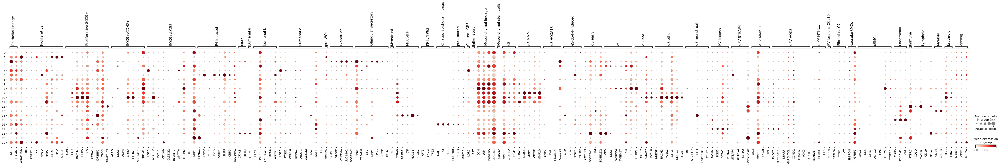

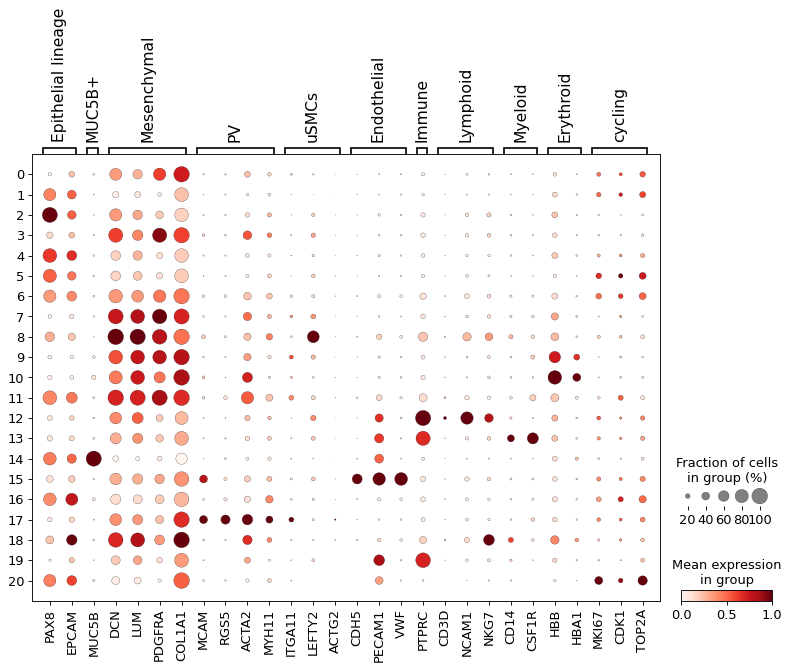

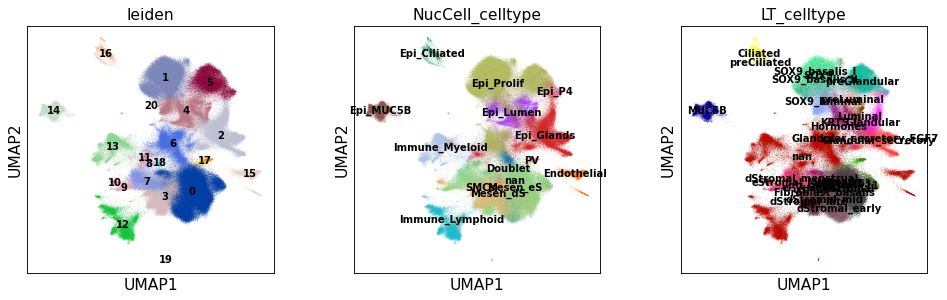

In [27]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', standard_scale='var', save='MARKERS_leiden.pdf')
sc.pl.dotplot(adata, marker_genes_short, groupby='leiden', standard_scale='var', save='MARKERS-short_leiden.pdf')
sc.pl.umap(adata, color=['leiden', 'NucCell_celltype', 'LT_celltype'],legend_loc='on data', legend_fontsize=9, save='_leiden.pdf')

... storing 'Nuc_celltype' as categorical
... storing 'Nuc_lineage' as categorical


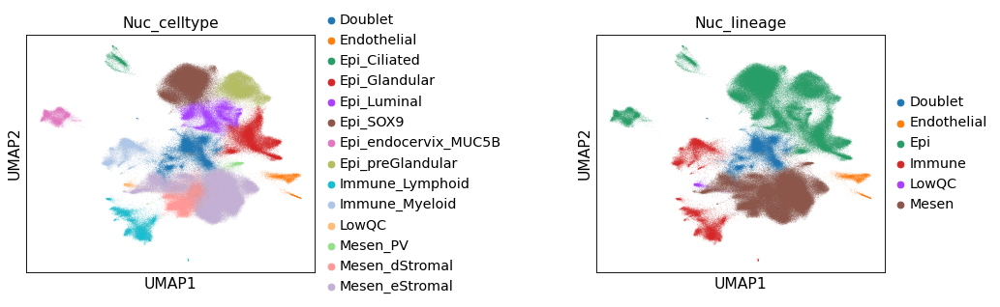

In [62]:
adata.obs['Nuc_celltype'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['Nuc_celltype'] == '0', 'Nuc_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Nuc_celltype'] == '1', 'Nuc_celltype'] = 'Epi_SOX9'
adata.obs.at[adata.obs['Nuc_celltype'] == '2', 'Nuc_celltype'] = 'Epi_Glandular'
adata.obs.at[adata.obs['Nuc_celltype'] == '3', 'Nuc_celltype'] = 'Mesen_dStromal'
adata.obs.at[adata.obs['Nuc_celltype'] == '4', 'Nuc_celltype'] = 'Epi_Luminal'
adata.obs.at[adata.obs['Nuc_celltype'] == '5', 'Nuc_celltype'] = 'Epi_preGlandular'
adata.obs.at[adata.obs['Nuc_celltype'] == '6', 'Nuc_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_celltype'] == '7', 'Nuc_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Nuc_celltype'] == '8', 'Nuc_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_celltype'] == '9', 'Nuc_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Nuc_celltype'] == '10', 'Nuc_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_celltype'] == '11', 'Nuc_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_celltype'] == '12', 'Nuc_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Nuc_celltype'] == '13', 'Nuc_celltype'] = 'Immune_Myeloid'
adata.obs.at[adata.obs['Nuc_celltype'] == '14', 'Nuc_celltype'] = 'Epi_endocervix_MUC5B'
adata.obs.at[adata.obs['Nuc_celltype'] == '15', 'Nuc_celltype'] = 'Endothelial'
adata.obs.at[adata.obs['Nuc_celltype'] == '16', 'Nuc_celltype'] = 'Epi_Ciliated'
adata.obs.at[adata.obs['Nuc_celltype'] == '17', 'Nuc_celltype'] = 'Mesen_PV'
adata.obs.at[adata.obs['Nuc_celltype'] == '18', 'Nuc_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_celltype'] == '19', 'Nuc_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Nuc_celltype'] == '20', 'Nuc_celltype'] = 'Epi_SOX9'


set(adata.obs['Nuc_celltype'])
adata.obs['Nuc_lineage'] = [str(i).split('_', 1)[0] for i in adata.obs['Nuc_celltype'] ]
sc.pl.umap(adata, color=['Nuc_celltype', 'Nuc_lineage'], wspace=0.8)
# adata.obs['Nuc_celltype'].cat.reorder_categories(['Epithelial', 'Epithelial_Glandular', 'Epithelial_Ciliated',  'Epithelial_Lumenal', 'Epithelial_SOX9'
#                                                       'Stromal', 'PV', 'Endothelial', 'Myeloid', 'Lymphoid', 'PNS',
#                                                        'Doublet',  'LowQC'], inplace=True)

# sc.pl.umap(adata, color=['Nuc_celltype'])

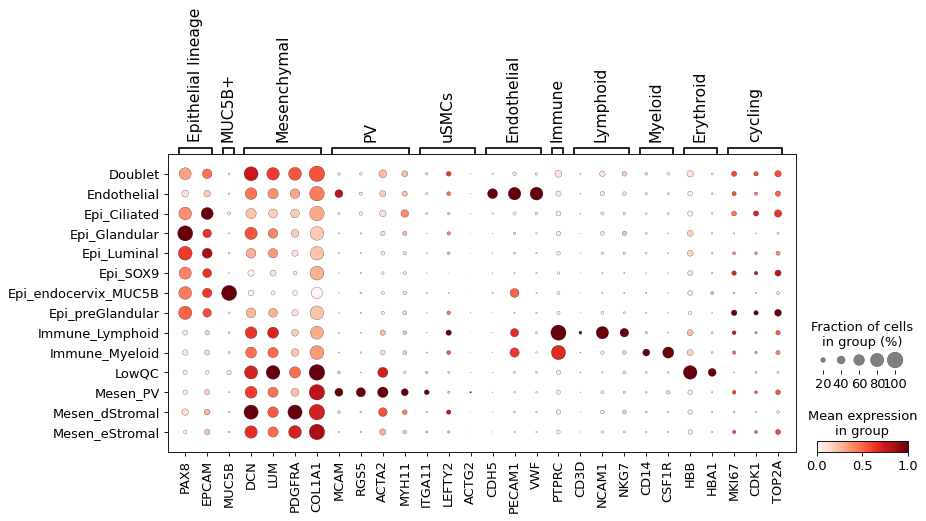

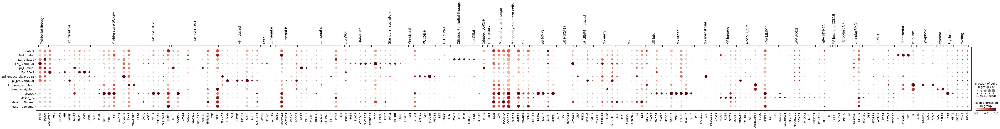

In [63]:
sc.pl.dotplot(adata, marker_genes_short, groupby='Nuc_celltype', standard_scale='var')
sc.pl.dotplot(adata, marker_genes, groupby='Nuc_celltype', standard_scale='var', save='MARKERS_celltype.pdf')

... storing 'leiden_cl' as categorical


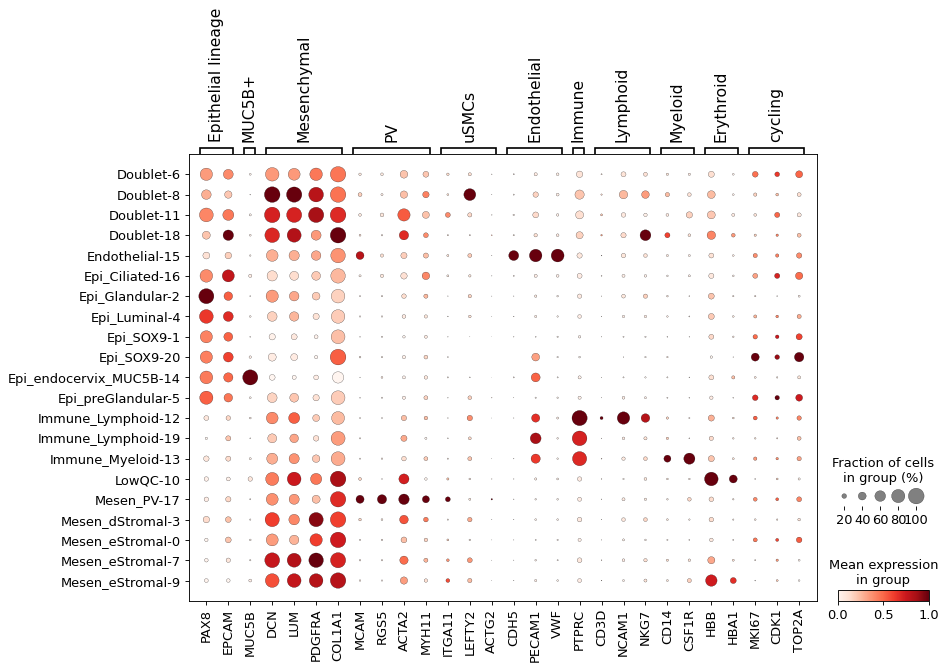

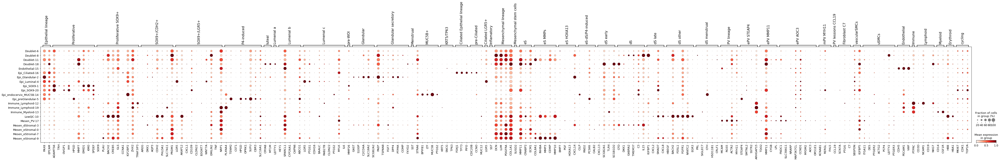

In [64]:
leiden_cl = [a + '-' + b for a, b in zip(adata.obs['Nuc_celltype'], 
                                                                  adata.obs['leiden'])]

adata.obs['leiden_cl'] = leiden_cl


sc.pl.dotplot(adata, marker_genes_short, groupby='leiden_cl', standard_scale='var', save='MARKERS_celltype_leiden.pdf')
sc.pl.dotplot(adata, marker_genes, groupby='leiden_cl', standard_scale='var', save='MARKERS_celltype_leiden.pdf')

In [65]:
# adata.write('x.h5ad')
pd.DataFrame(adata.obs).to_csv('/nfs/team292/lg18/endometriosis/annotations/nuclei_endometrium.csv')

In [66]:
sampleID = [a + '-' + b + '_' + c + '-' + d for a, b, c, d in zip(adata.obs['StudyName'], 
                                                                  adata.obs['genotype'], 
                                                                  adata.obs['Treatment'], 
                                                                  adata.obs['library'])]

adata.obs['genotype_libraryType'] = sampleID

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

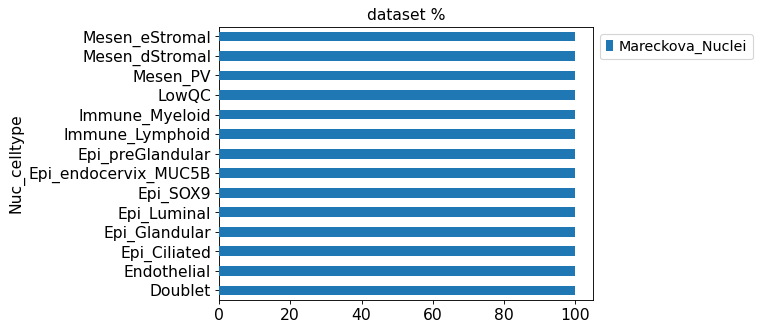

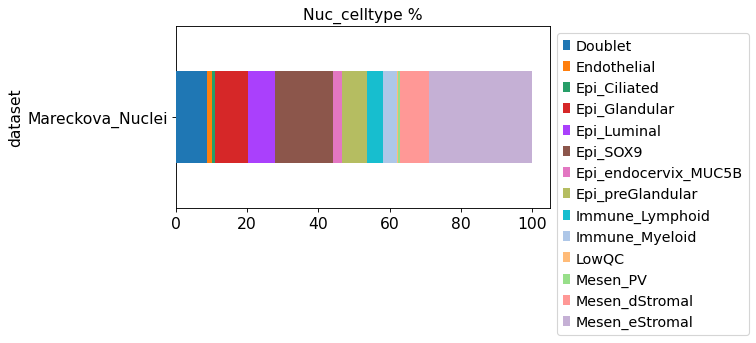

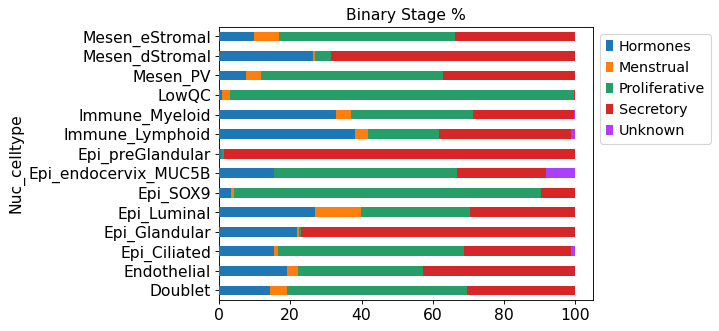

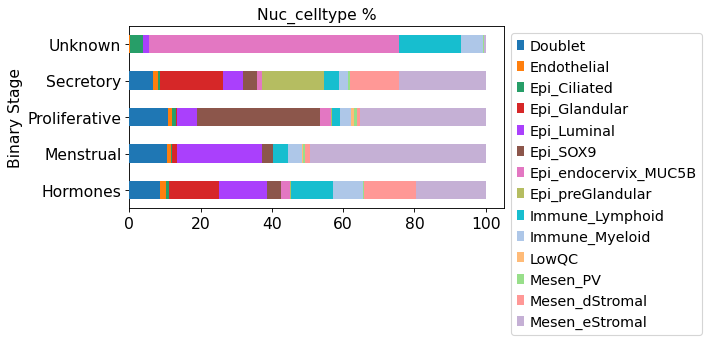

In [67]:
Barplot('dataset', adata, var='Nuc_celltype', height=4.5)
Barplot('Nuc_celltype', adata, var='dataset', height=3)
Barplot('Binary Stage', adata, var='Nuc_celltype', height=4.5)
Barplot('Nuc_celltype', adata, var='Binary Stage', height=3)
# Barplot('LT_celltype', adata, var='Nuc_celltype', height=6)

In [68]:
adata.obs['Nuc_celltype'].values.describe()

,counts,freqs
categories,,
Doublet,32688,0.087667
Endothelial,5191,0.013922
Epi_Ciliated,3197,0.008574
Epi_Glandular,34810,0.093358
Epi_Luminal,27730,0.074370
Epi_SOX9,60556,0.162406
Epi_endocervix_MUC5B,9371,0.025132
Epi_preGlandular,26659,0.071497
Immune_Lymphoid,16948,0.045453


# TF-IDF

In [69]:
import anndata
adataDown = adata[[ i in ["G1"] for i in adata.obs.phase ]]
adataDown = sc.pp.subsample(adataDown, fraction=0.25, random_state=0, copy=True) 
sc.pp.filter_cells(adataDown, min_genes=2000)
sc.pp.filter_genes(adataDown, min_cells=5)
print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 50

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['leiden'].isin([cl])] for cl in adataDown.obs['leiden'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=20)
print(adataDown.obs['leiden'].value_counts())

del adata_downsampled
del adatas

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 2313 cells that have less than 2000 genes expressed
filtered out 1678 genes that are detected in less than 5 cells


0     14552
1      8742
2      7447
3      6431
4      5104
6      4209
5      3514
7      3334
13     2549
12     2468
14     1873
8      1081
15      911
9       676
16      499
17      369
11      284
10      254
18       91
19       18
20        5
Name: leiden, dtype: int64


filtered out 14080 genes that are detected in less than 20 cells
Trying to set attribute `.var` of view, copying.


0     50
1     50
18    50
17    50
16    50
15    50
14    50
13    50
12    50
11    50
10    50
9     50
8     50
7     50
6     50
5     50
4     50
3     50
2     50
19    18
20     5
Name: leiden, dtype: int64


In [70]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [71]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [72]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 17820 973 
metadata(0):
assays(1): X
rownames(17820): A1BG A1BG-AS1 ... ZYX ZZEF1
rowData names(165): gene_ids.0 feature_types.0 ... variances_norm
  highly_variable_nbatches
colnames(973): UA_Endo11460961_GTCAAACGTCACGCTG
  UA_Endo12269811_CAACCAATCGCCAGTG ... UA_Endo12269810_CATGGTAGTCGTGCCA
  UA_Endo12061705_TTCATTGCAGCTATAC
colData names(57): library StudyName ... genotype_libraryType cell
reducedDimNames(0):
altExpNames(0):


### By Leiden

In [73]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$leiden


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF = subset(df_tfIDF, qval <= 0.05)
df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(sort(as.numeric(df_tfIDF$cluster)))  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = paste('leiden', levels(df_tfIDF$cluster) )

In [74]:
df_tfIDF.to_csv(str(sc.settings.figdir)+'/TFIDF_leiden.tsv', index=False, sep='\t')

... storing 'genotype_libraryType' as categorical


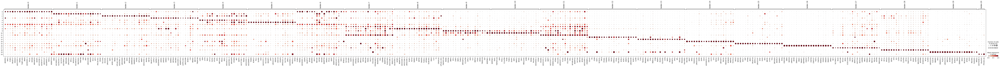

In [75]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='leiden', standard_scale = 'var', save='TFIDF_leiden.pdf')#topgenes_tfIDF

## By celltype

In [76]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$Nuc_celltype


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(df_tfIDF$cluster)  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = unique(df_tfIDF$cluster)

In [77]:
df_tfIDF.to_csv(str(sc.settings.figdir)+'/TFIDF_celltype.tsv', index=False, sep='\t')

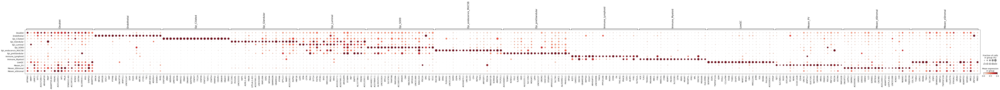

In [78]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 

sc.pl.dotplot(adata, topgenes_tfIDF, groupby='Nuc_celltype', standard_scale = 'var', save='TFIDF_celltype.pdf')#topgenes_tfIDF

In [79]:
adata.obs.head()

,n_genes,sample,library,StudyName,SampleID,Lane,Processing,Type,BiopsyType,BiopsyType_II,...,LT_celltype,LT_epi_celltype,LT_mesen_celltype,LT_celltype_rm,leiden,leiden_R,Nuc_celltype,Nuc_lineage,leiden_cl,genotype_libraryType
UA_Endo12449300_CTTCAATGTACCGGAA,3302,UA_Endo12449300_EX0045,UA_Endo12449300,Marecckovaa,UA_Endo12449300,43996.0,Frozen,Nuclei,Superficial,NaN,...,SOX9,SOX9,nan,SOX9,1,1,Epi_SOX9,Epi,Epi_SOX9-1,Marecckovaa-EX0045_None-UA_Endo12449300
UA_Endo11596521_GAACACTCAGAGAAAG,2282,UA_Endo11596521_FX1236,UA_Endo11596521,Marecckovaa,UA_Endo11596521,43281.0,Frozen,Nuclei,Superficial,NaN,...,eStromal,nan,eStromal,eStromal,0,0,Mesen_eStromal,Mesen,Mesen_eStromal-0,Marecckovaa-FX1236_None-UA_Endo11596521
UA_Endo12865963_TGCGGGTAGGGAGGGT,2786,UA_Endo12865963_FX1087,UA_Endo12865963,Marecckovaa,UA_Endo12865963,44999.0,Frozen,Nuclei,Superficial,NaN,...,Glandular_secretory,Glandular_secretory,nan,Glandular_secretory,2,2,Epi_Glandular,Epi,Epi_Glandular-2,Marecckovaa-FX1087_None-UA_Endo12865963
UA_Endo12449301_TCAGTGATCGTAGGGA,2071,UA_Endo12449301_FX1150,UA_Endo12449301,Marecckovaa,UA_Endo12449301,43996.0,Frozen,Nuclei,Superficial,NaN,...,eStromal_MMPs,nan,eStromal_MMPs,eStromal_MMPs,7,7,Mesen_eStromal,Mesen,Mesen_eStromal-7,Marecckovaa-FX1150_None-UA_Endo12449301
UA_Endo12865960_GAGACTTAGAGATCGC,1890,UA_Endo12865960_FX1170,UA_Endo12865960,Marecckovaa,UA_Endo12865960,44999.0,Frozen,Nuclei,Superficial,NaN,...,preGlandular,preGlandular,nan,preGlandular,5,5,Epi_preGlandular,Epi,Epi_preGlandular-5,Marecckovaa-FX1170_None-UA_Endo12865960


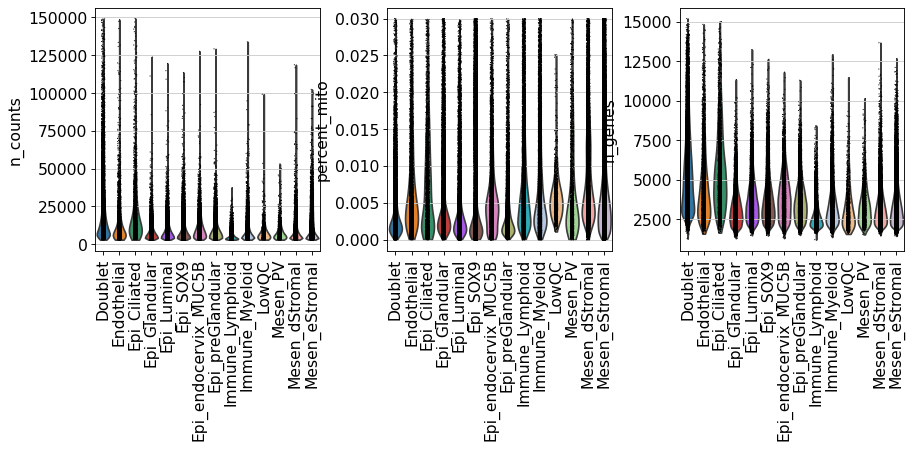

In [80]:
sc.pl.violin(adata, ['n_counts', 'percent_mito', 'n_genes'], groupby='Nuc_celltype', rotation = 90) #hPGCs

In [81]:
adata.write('/nfs/team292/lg18/endometriosis/clustered_objects/nuclei.h5ad')